# Outline
#### In this analysis of data from Airbnb, I follow the steps of the CRISP-DM process:
- Business Understanding & Research Questions
- Data Collection & Understanding
- Data Preparation & Wrangling
- Feature Selection, Modeling, & Evaluation
- Summary

# Step 1: Business Understanding & Research Questions

For this analysis, **I take the perspective of a customer of Airbnb** who plans a trip to Munich. I thus look into data of the past year to generate insights on accommodation with Airbnb in Munich. In particular, I am interested in the pricing, timing, location, & availability of Airbnb accommodation in general. I consider these factors to determine supply & demand on the market for temporary accommodation.

My research questions are:
- **When was the most expensive time to book an Airbnb listing in Munich in 2019?**
- **Where were the most expensive listings located?**
- **When were the most listings available?**
- **Are there any aspects of a listing which allow to conclude whether a listing is available?**

# Step 2.1: Data Collection

#### Import Python libraries

In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import pandas as pd
import seaborn as sns
from shapely.geometry import Point, Polygon
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score

%matplotlib inline

In [3]:
!ls

README.md
airbnb_munich_2019_data
dsend_project_1.ipynb
upperbavaria_geodata


#### Read in data on Munich, as provided by Airbnb

In [4]:
df_calendar = pd.read_csv('airbnb_munich_2019_data/calendar.csv.gz', compression='gzip') # validated: df_calendar has time series data on the listings from df_listings with: len(df_calendar.listing_id.unique()). Also check 11481 * 365
df_listings = pd.read_csv('airbnb_munich_2019_data/listings.csv') # validated latitude & longitude data with a GPS coordinates finder (https://www.gps-coordinates.net/)
df_listings_detailed = pd.read_csv('airbnb_munich_2019_data/listings.csv.gz', compression='gzip')
df_neighbourhoods = pd.read_csv('airbnb_munich_2019_data/neighbourhoods.csv')
df_neighbourhoods_geo = pd.read_json('airbnb_munich_2019_data/neighbourhoods.geojson') # here Airbnb listings are grouped by hood
df_areas = gpd.read_file('airbnb_munich_2019_data/neighbourhoods.geojson')
df_reviews = pd.read_csv('airbnb_munich_2019_data/reviews.csv')
df_reviews_detailed = pd.read_csv('airbnb_munich_2019_data/reviews.csv.gz', compression='gzip')

C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3051: DtypeWarning: Columns (43,61,62,94) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


#### Add geographic data on Upper Bavaria, as provided by OpenStreetMap

In [5]:
railways = gpd.read_file('upperbavaria_geodata/gis_osm_railways_free_1.shp')
roads = gpd.read_file('upperbavaria_geodata/gis_osm_roads_free_1.shp')

# Identifying the EPSG code of the OpenStreetMap data.
roads.crs

{'init': 'epsg:4326'}

In [6]:
# create a GeoDataFrame from the geographic information in the Airbnb data
df_listings_geodata = gpd.GeoDataFrame(df_listings_detailed, geometry=[Point(coordinates) for coordinates in zip(df_listings_detailed['longitude'], df_listings_detailed['latitude'])])

# set the coordinate reference system with the same EPSG code as the geographic data from OpenStreetMap
df_listings_geodata.crs = {'init' :'epsg:4326'}

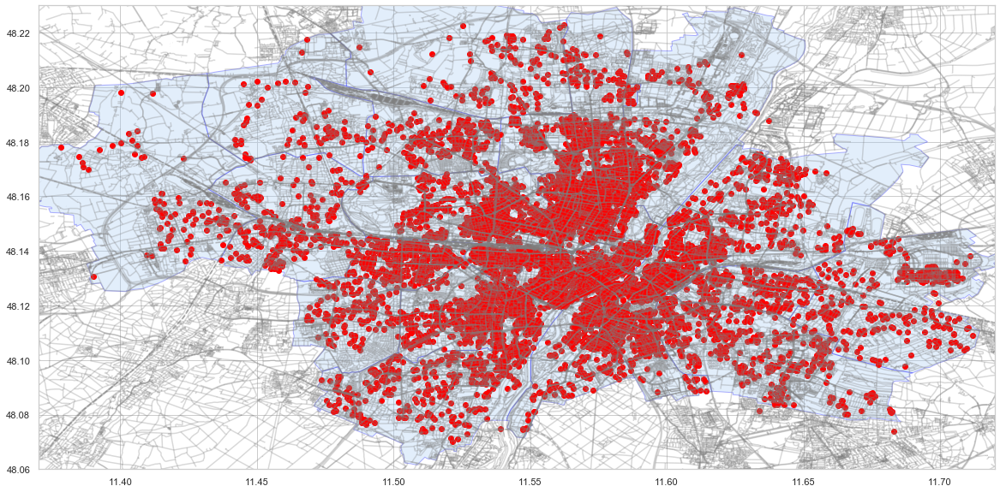

In [7]:
# Plotting all the Airbnb listings in Munich.
sns.set(style='whitegrid', palette='pastel')
sns.mpl.rc('figure', figsize=(20, 20))

fig, ax = plt.subplots()
plt.axis([11.37, 11.72, 48.06, 48.23])

df_areas.plot(ax=ax, alpha=0.3, edgecolor='blue')
railways.plot(ax=ax, alpha=0.3, color='grey', linestyle='dashed')
roads.plot(ax=ax, alpha=0.3, color='grey')
df_listings_geodata.plot(ax=ax, color='red')

In [8]:
def visualize_geo_data(dataframe, color=None, zoom=None, markersize=20):
    """Accepts a GeoDataFrame & visualizes its geographic data in a matplotlib plot.
        
    :param dataframe: geopandas.geodataframe.GeoDataFrame
    :param color: str
    :param zoom: list of float64 (coordinates)
    :param markersize: int

    :return: None
    
    >>> visualize_geo_data(df_listings, 'Airbnb listings', color='red')
    """
    
    if zoom == None:
        zoom = [11.35, 11.73, 48.06, 48.25]
    
    sns.set(font_scale=2, style='whitegrid', palette='pastel')
    sns.mpl.rc('figure', figsize=(30, 20))

    fig, ax = plt.subplots()
    ax.grid(False)
    ax.set(xlabel='Longitude', ylabel='Latitude')
    ax.xaxis.labelpad = 28
    ax.yaxis.labelpad = 28
    plt.axis(zoom)

    df_areas.plot(ax=ax, alpha=0.15, edgecolor='blue')
    railways.plot(ax=ax, alpha=0.3, color='grey', linestyle='dashed')
    roads.plot(ax=ax, alpha=0.3, color='grey')
    dataframe.plot(ax=ax, color=color, markersize=markersize)

# Step 2.2: Data Understanding

In this section, I have a first peek at all the Airbnb data sets on a high level. At the same time, I search for unexpected data types. From here on, I start to focus on two data sets, df_calendar & df_listings_detailed, as they provide the information which I need. I therefore perform some small checks to understand these two data sets in particular.

#### Findings:

df_calendar:
- has data on date in non-datetime format
- has non-numeric data on price
- dataframe has "year" information shifted by one year, see check_1
- dataframe has data for each listing for an entire year, see check_2

df_listings_detailed:
- has non-numeric data on price
- has the same number of listings as df_calendar, see check_3
- has slightly different data on price, as compared to the average price per listing in the df_calendar time series data, see check_4

#### Description of Airbnb data sets

In [9]:
print("".join(["\n", "Name: ", "df_calendar"]))
df_calendar.info()
print("".join(["\n", "Name: ", "df_listings"]))
df_listings.info()
print("".join(["\n", "Name: ", "df_listings_detailed"]))
df_listings_detailed.info(verbose=True)
print("".join(["\n", "Name: ", "df_neighbourhoods"]))
df_neighbourhoods.info(verbose=True)
print("".join(["\n", "Name: ", "df_neighbourhoods_geo"]))
df_neighbourhoods_geo.info(verbose=True)
print("".join(["\n", "Name: ", "df_areas"]))
df_areas.info(verbose=True)
print("".join(["\n", "Name: ", "df_reviews"]))
df_reviews.info(verbose=True)
print("".join(["\n", "Name: ", "df_reviews_detailed"]))
df_reviews_detailed.info(verbose=True)


Name: df_calendar
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4190565 entries, 0 to 4190564
Data columns (total 7 columns):
listing_id        int64
date              object
available         object
price             object
adjusted_price    object
minimum_nights    int64
maximum_nights    int64
dtypes: int64(3), object(4)
memory usage: 223.8+ MB

Name: df_listings
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11481 entries, 0 to 11480
Data columns (total 16 columns):
id                                11481 non-null int64
name                              11459 non-null object
host_id                           11481 non-null int64
host_name                         11458 non-null object
neighbourhood_group               0 non-null float64
neighbourhood                     11481 non-null object
latitude                          11481 non-null float64
longitude                         11481 non-null float64
room_type                         11481 non-null object
price           

#### df_calendar

In [10]:
# Converting the date column from object to datetime.
df_calendar.date = pd.to_datetime(df_calendar.date, format='%Y-%m-%d')

In [11]:
# Check_1: Deducting one year from the date column to shift the data into the past year.
df_calendar.date = df_calendar.date - pd.DateOffset(years=1)

In [12]:
def convert_price_dtype(dataframe, price_column):
    """Converts the type of data in a dataframe's column on price data from string to float.
    
    Before the type conversion, this method will remove $ and , symbols of the price data.
    After the conversion, it will overwrite the current price column.
    
    :param dataframe: pandas.core.frame.DataFrame
    :param price_column: str
    
    >>> df['price'] = convert_price_dtype(df, 'price')  
    """
    
    print("Original type of data in price column:", dataframe[price_column].dtypes)
    dataframe[price_column] = dataframe[price_column].str.strip('$')
    dataframe[price_column] = dataframe[price_column].str.replace(',', '') # strip(',') did not work for me here
    dataframe[price_column] = dataframe[price_column].astype('float')
    print("New type of data in price column:", dataframe[price_column].dtypes)
    return dataframe[price_column]

In [13]:
# Converting the price column in df_calendar from string to float.
df_calendar['price'] = convert_price_dtype(df_calendar, 'price')

Original type of data in price column: object
New type of data in price column: float64


In [14]:
# Converting the adjusted_price column in df_calendar from string to float.
df_calendar['adjusted_price'] = convert_price_dtype(df_calendar, 'adjusted_price')

Original type of data in price column: object
New type of data in price column: float64


In [15]:
# Verify whether there is a big difference between price and adjusted_price of the time series data.
df_calendar_price_mean = df_calendar.groupby('listing_id').mean()['price'].mean()
print(df_calendar_price_mean)
df_calendar_adjusted_price_mean = df_calendar.groupby('listing_id').mean()['adjusted_price'].mean()
print(df_calendar_adjusted_price_mean)

113.840855231969
113.79676165508866


In [16]:
# Check_2: Indicating whether df_calendar has data for every day of 2019 for every listing.
check_2 = len(df_calendar) / 365 == len(df_listings)
print(check_2)

True


#### df_listings_detailed

In [17]:
# Converting the price column in df_listings_detailed from string to float.
df_listings_detailed['price'] = convert_price_dtype(df_listings_detailed, 'price')

Original type of data in price column: object
New type of data in price column: float64


In [18]:
# Check_3: Calculating whether there is an equal number of listings in df_calendar and df_listings_detailed.
check_3 = len(df_calendar.groupby('listing_id').mean()) == len(df_listings_detailed)
print(check_3)

True


In [19]:
# Check_4: Validating whether the listings are the same.
df_listings_detailed_price_mean = df_listings_detailed.price.mean()

if df_calendar_price_mean == df_listings_detailed_price_mean:
    print("check_4: The information on price of each listing is identical")
else:
    print("check_4: The information on price of each listing differs.")
    print("df_calendar data on mean price:", df_calendar_price_mean)
    print("df_listings_detailed data on mean price:", df_listings_detailed_price_mean)

check_4: The information on price of each listing differs.
df_calendar data on mean price: 113.840855231969
df_listings_detailed data on mean price: 116.33646894869784


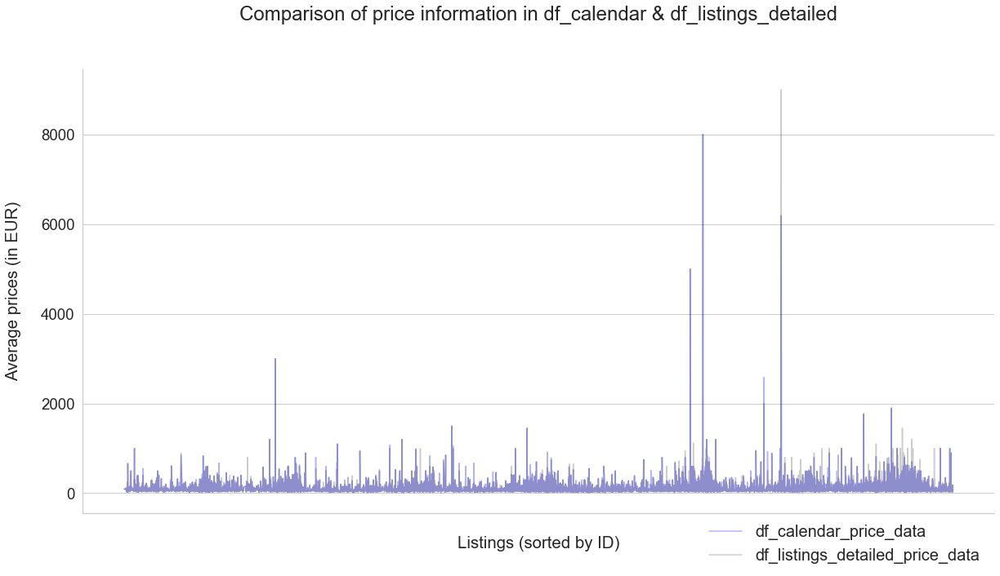

In [23]:
# Further visual analysis to understand to which extent the price information of both dataframes differ.
# Here I looked at the shades, i.e., wether the price information overlaps.
# I ignored the small differences in the end, but cleaned (by imputation) the data from outliers.
df_calendar_per_listing = df_calendar.groupby('listing_id').mean()['price']
df_calendar_per_listing = df_calendar_per_listing.sort_index()
df_listings_detailed_prices = df_listings_detailed.groupby('id').mean()['price']
df_listings_detailed_prices = df_listings_detailed_prices.sort_index()

f, ax = plt.subplots(figsize=(20,10))

plt1 = sns.lineplot(ax=ax, x=df_calendar_per_listing.index, y=df_calendar_per_listing, color="blue", alpha=0.3)
plt2 = sns.lineplot(ax=ax, x=df_listings_detailed_prices.index, y=df_listings_detailed_prices, color="black", alpha=0.2)

sns.set(font_scale=2, style='whitegrid')
sns.despine()
ax.set_title('Comparison of price information in df_calendar & df_listings_detailed', y=1.10)
ax.set(xlabel='Listings (sorted by ID)', ylabel='Average prices (in EUR)')
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
ax.xaxis.labelpad = 28
ax.yaxis.labelpad = 24
plt.legend(['df_calendar_price_data', 'df_listings_detailed_price_data'], loc="center right", bbox_to_anchor=(1, -0.07), fontsize='small', frameon=False)

# Step 3.1: Data Preparation

In the previous step, I finished with a figure which points to outliers in the price data of both df_calendar & df_listings_detailed. Here I therefore start with a search for a threshold to identify outliers in the price data. I then impute their values with the mean price data.

Afterwards I search for duplicate data & for NaN data in the df_calendar & df_listings_detailed data sets.

#### Preparing df_calendar: Searching for outliers in the price data

In [24]:
df_calendar.price.describe()

count    4.190394e+06
mean     1.138422e+02
std      1.575467e+02
min      9.000000e+00
25%      5.500000e+01
50%      8.200000e+01
75%      1.300000e+02
max      9.039000e+03
Name: price, dtype: float64

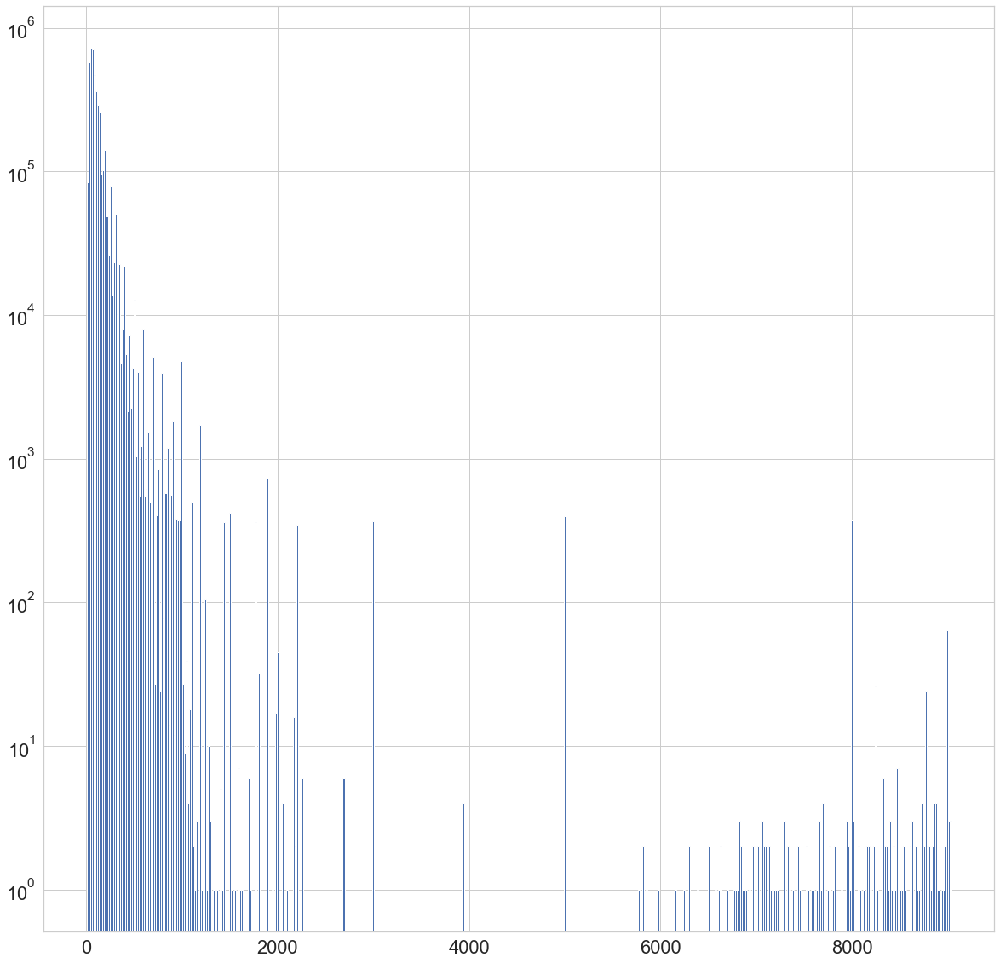

In [25]:
df_calendar.price.hist(log=True, bins=500, figsize=(20,20))

In [26]:
# Calculating the percentage of price data in df_calendar which can be considered as outliers.
outlier_share = round(df_calendar[df_calendar.price > 400]['listing_id'].count() / len(df_calendar), 2) * 100
print(outlier_share, "% of the price data in df_calendar is above 400 EUR.")

2.0 % of the price data in df_calendar is above 400 EUR.


In [27]:
# Imputing all price data which is above 400 EUR with the average price of the listings below 400 EUR.
df_calendar_price_avg = df_calendar[df_calendar.price < 400]['price'].mean()
df_calendar.loc[df_calendar.price > 400, 'price'] = df_calendar_price_avg

#### Preparing df_calendar: Search for duplicate data

In [28]:
# Counting the number of duplicated rows.
print("There are", len(df_calendar[df_calendar.duplicated(keep=False) == True]), "rows with duplicated values.")

# Filtering for all duplicated data.
df_calendar[df_calendar.duplicated(keep=False) == True]

There are 22152 rows with duplicated values.


,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
156,36720,2019-02-28,f,95.0,95.0,2,730
157,36720,2019-02-28,f,95.0,95.0,2,730
270,216529,2019-02-28,t,150.0,150.0,5,60
271,216529,2019-02-28,t,150.0,150.0,5,60
310,159634,2019-02-28,f,53.0,53.0,14,90
...,...,...,...,...,...,...,...
4188836,40269201,2019-02-28,t,86.0,86.0,30,730
4189930,40284350,2019-02-28,f,80.0,80.0,1,30
4189931,40284350,2019-02-28,f,80.0,80.0,1,30
4190295,40287455,2019-02-28,f,43.0,43.0,26,1125


In [29]:
# Dropping all duplicates.
df_calendar = df_calendar.drop_duplicates()

#### Preparing df_calendar: Search for NaN data

In [30]:
# Dropping rows which have NaN values only.
df_calendar = df_calendar.dropna(how='all')

In [31]:
# Counting number of missing values in times series data.
print("".join(["\n", "NaN values:"]))
df_calendar.isnull().sum()


NaN values:


listing_id          0
date                0
available           0
price             171
adjusted_price    171
minimum_nights      0
maximum_nights      0
dtype: int64

In [32]:
# Filtering df_calendar for missing data in the price column.
df_calendar_nans = df_calendar[df_calendar.price.isnull()]

# Generating summary statistics on the dataframe with missing price data.
# Apparently all data is missing for the same listing_id.
df_calendar_nans.describe()

,listing_id,price,adjusted_price,minimum_nights,maximum_nights
count,171.0,0.0,0.0,171.0,171.0
mean,31916328.0,NaN,NaN,30.0,180.0
std,0.0,NaN,NaN,0.0,0.0
min,31916328.0,NaN,NaN,30.0,180.0
25%,31916328.0,NaN,NaN,30.0,180.0
50%,31916328.0,NaN,NaN,30.0,180.0
75%,31916328.0,NaN,NaN,30.0,180.0
max,31916328.0,NaN,NaN,30.0,180.0


In [33]:
# Validating that all entries with missing price data are related to the same listing_id.
print("Number of entries in df_calendar_nans which are not related to listing_id '31916328':", len(df_calendar_nans.listing_id[df_calendar_nans.listing_id != 31916328]))

Number of entries in df_calendar_nans which are not related to listing_id '31916328': 0


In [34]:
# Checking whether this listing_id has generally no price information in df_calendar.
print("Number of entries in df_calendar related to listing_id '31916328' with price data:", len(df_calendar.price[(df_calendar.listing_id == 31916328) & (df_calendar.price.notnull())]))

Number of entries in df_calendar related to listing_id '31916328' with price data: 193


In [35]:
# Imputing the missing price data in df_calendar with the mean of the available price data on listing_id '31916328'.
mean_price_id_31916328 = df_calendar.price[(df_calendar.listing_id == 31916328) & (df_calendar.price.notnull())].mean()
df_calendar.price = df_calendar.price.fillna(mean_price_id_31916328)
df_calendar.price.isnull().any()

False

#### Preparing df_listings_detailed: Searching for outliers in the price data

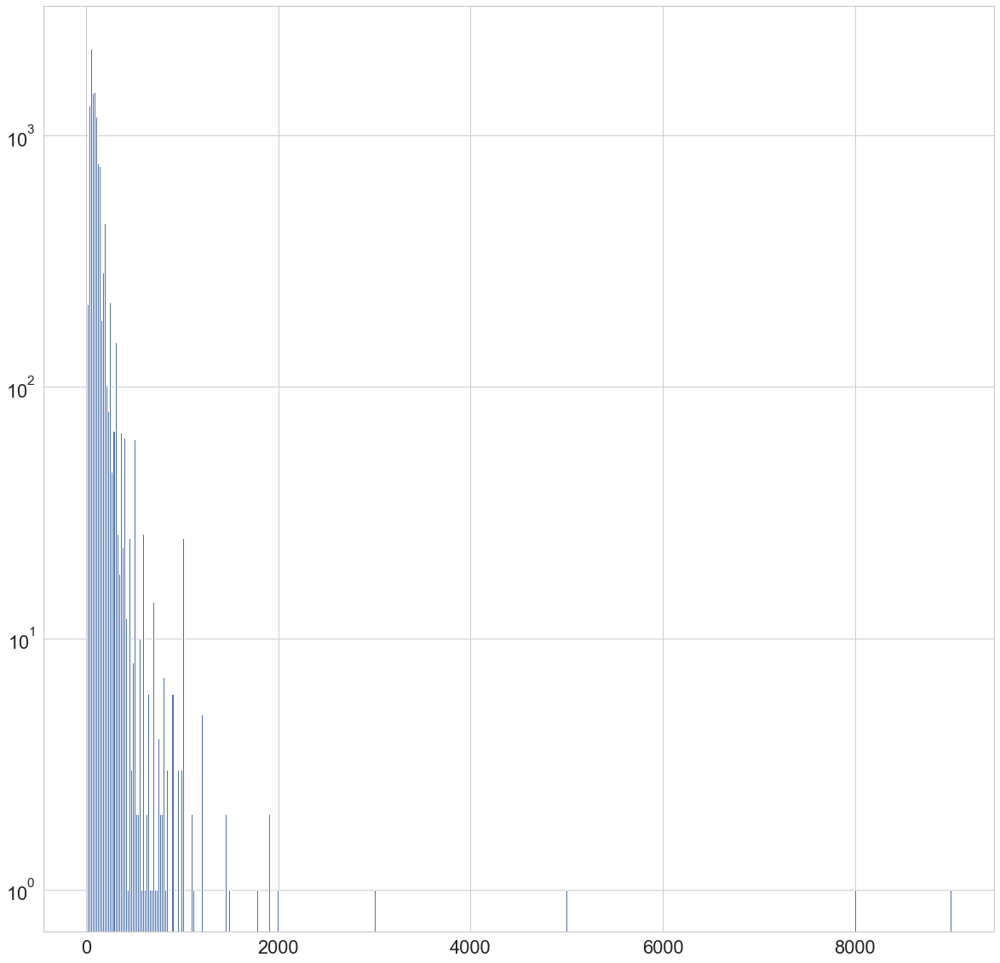

In [36]:
df_listings_detailed.price.hist(log=True, bins=500, figsize=(20,20))

In [37]:
# Calculating the percentage of price data in df_listings_detailed which can be considered as outliers.
outlier_share = round(df_listings_detailed[df_listings_detailed.price > 400]['id'].count() / len(df_listings_detailed),2) * 100
print(outlier_share, "% of the price data in df_listings_detailed is above 400 EUR.")

2.0 % of the price data in df_listings_detailed is above 400 EUR.


In [38]:
# Imputing all price data which is above 400 EUR with the average price of the listings below 400 EUR.
df_listings_detailed_price_avg = df_listings_detailed[df_listings_detailed.price < 400]['price'].mean()
df_listings_detailed.loc[df_listings_detailed.price > 400, 'price'] = df_listings_detailed_price_avg

#### Preparing df_listings_detailed: Search for duplicate data

In [39]:
print("There are", len(df_listings_detailed[df_listings_detailed.duplicated() == True]), "rows with duplicated values.")

There are 0 rows with duplicated values.


#### Preparing df_listings_detailed: Search for NaN data

In [40]:
# Counting number of missing values in times series data.
print("".join(["\n", "NaN values:"]))
df_listings_detailed.isnull().sum()


NaN values:


id                                                 0
listing_url                                        0
scrape_id                                          0
last_scraped                                       0
name                                              22
                                                ... 
calculated_host_listings_count_entire_homes        0
calculated_host_listings_count_private_rooms       0
calculated_host_listings_count_shared_rooms        0
reviews_per_month                               2554
geometry                                           0
Length: 107, dtype: int64

In [41]:
# Dropping columns with only NaN values.
df_listings_detailed = df_listings_detailed.dropna(axis=1, how='all')

# Step 3.2: Data Wrangling

In this section, I answer the first three research questions. The results are presented at each question.

# When was the most expensive time to book an Airbnb listing in Munich in 2019?

#### Results:
- In general, prices remained quite stable over the year, with exception of the period of the Oktoberfest.
- Hosts, who tend to make significant changes on their prices, particularly raised their prices in the springtime.

#### Finding average prices per day

In [42]:
avg_price = df_calendar.groupby('date').mean()['price'].mean()
avg_price

100.59629739654666

In [43]:
# Finding the time of the year with the top 10 average price of all listings.
prices_per_day = df_calendar.groupby('date').mean()['price']
prices_per_day.sort_values(ascending=False).head(10)

date
2019-09-26    110.685168
2019-09-25    110.675192
2019-10-02    110.617706
2019-10-03    110.608419
2019-09-19    110.542330
2019-09-27    109.496458
2019-09-29    109.419950
2019-09-30    109.409531
2019-10-04    109.407200
2019-09-22    109.385545
Name: price, dtype: float64

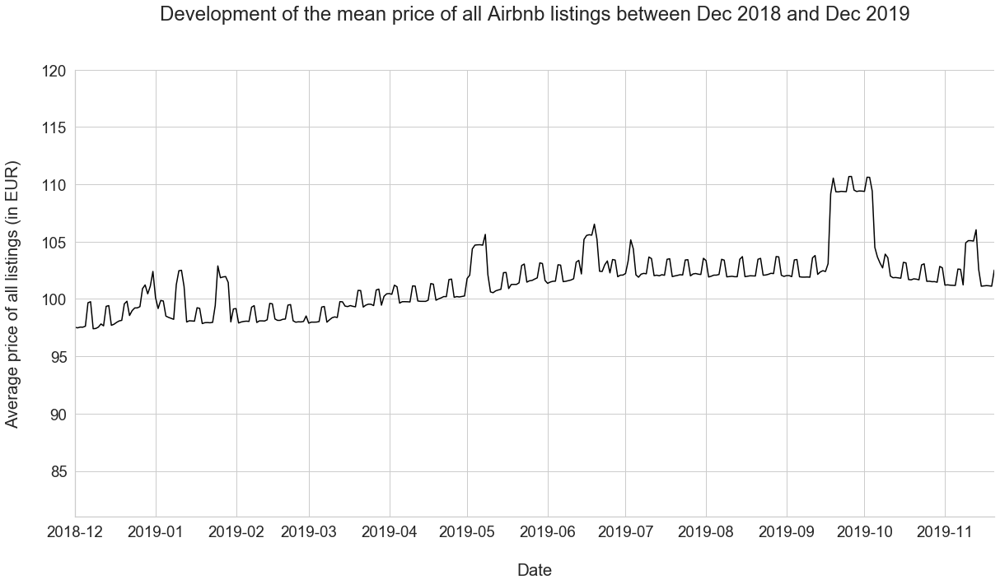

In [47]:
f, ax = plt.subplots(figsize=(20,10))

plt1 = sns.lineplot(ax=ax, x=prices_per_day.index, y=prices_per_day, color="black")

sns.set(font_scale=2, style='whitegrid')
sns.despine()
ax.set_title('Development of the mean price of all Airbnb listings between Dec 2018 and Dec 2019', y=1.10)
ax.set(xlabel='Date', ylabel='Average price of all listings (in EUR)', xlim=['2018-12-01', '2019-11-20'], ylim=[81.0,120.0])
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
ax.xaxis.labelpad = 28
ax.yaxis.labelpad = 24

#### Checking whether prices generally can change over a year

In [48]:
# Grouping the time series data by the listings and each their dates.
days_per_listing = df_calendar.groupby(['listing_id', 'date']).sum()

# Counting the number of listings in the time series data.
data_per_listing = df_calendar.groupby('listing_id').sum()
listings = list(data_per_listing.index)

In [49]:
# Finding the number of listings with prices deviating from their mean price over the last year.
listings_deviating_prices = []
std_all = []
for listing in listings:
    listing_std = days_per_listing.loc[listing]['price'].std()
    if listing_std != 0:
        listings_deviating_prices.append(listing)
        std_all.append(listing_std)

print(len(listings_deviating_prices), "listings (i.e.,", round(len(listings_deviating_prices) / len(listings), 2)*100, "% of all listings) have changed their prices over the past year.")

5370 listings (i.e., 47.0 % of all listings) have changed their prices over the past year.


In [50]:
# Since almost half of the listings have changed their prices of the year: 
# Searching for a threshold to filter for listings with a comparatively very strong price deviation.
std_all_array = np.array(std_all)
top_deviators = np.percentile(std_all_array, 99)
print(top_deviators)

88.02059198133735


In [51]:
# Finding those listings with large price changes.
# I could have used a list comprehension here as well, but it would have been very complex to read.
listings_deviating_prices_strongly = []
for listing in listings:
    listing_std = days_per_listing.loc[listing]['price'].std()
    if listing_std > top_deviators:
        listings_deviating_prices_strongly.append(listing)
        
print(len(listings_deviating_prices_strongly), "listings (i.e.,", round(len(listings_deviating_prices_strongly) / len(listings), 3)*100, "% of all listings) have changed their prices over the past year more strongly.")

54 listings (i.e., 0.5 % of all listings) have changed their prices over the past year more strongly.


In [52]:
# Filtering for strong price deviators.
strong_deviators = df_calendar[df_calendar['listing_id'].isin(listings_deviating_prices_strongly)]
prices_per_day_strong_deviators = strong_deviators.groupby('date').mean()['price']

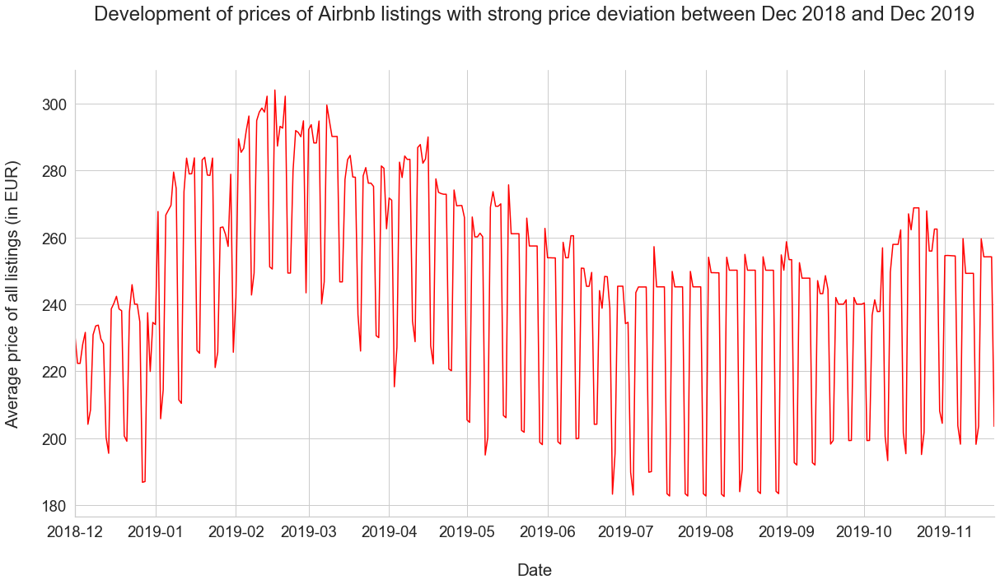

In [54]:
f, ax = plt.subplots(figsize=(20,10))

plt3 = sns.lineplot(ax=ax, x=prices_per_day_strong_deviators.index, y=prices_per_day_strong_deviators, color="red")

sns.set(font_scale=2, style='whitegrid')
sns.despine()
ax.set_title('Development of prices of Airbnb listings with strong price deviation between Dec 2018 and Dec 2019', y=1.10)
ax.set(xlabel='Date', ylabel='Average price of all listings (in EUR)', xlim=['2018-12-01', '2019-11-20'])
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
ax.xaxis.labelpad = 28
ax.yaxis.labelpad = 24

# Where were the most expensive listings located?

#### Results:
- Central areas have the on average most expensive listings.
- During the Oktoberfest, expensive listings cluster in the city center, whereas less expensive listings spread all over Munich.

#### Sorting areas by their mean price of Airbnb listings above the overall average price

In [55]:
prices_area = df_listings_detailed.price.groupby(df_listings_detailed['neighbourhood']).mean().sort_values()
prices_area_above_avg = prices_area[prices_area > df_calendar.price.mean()]

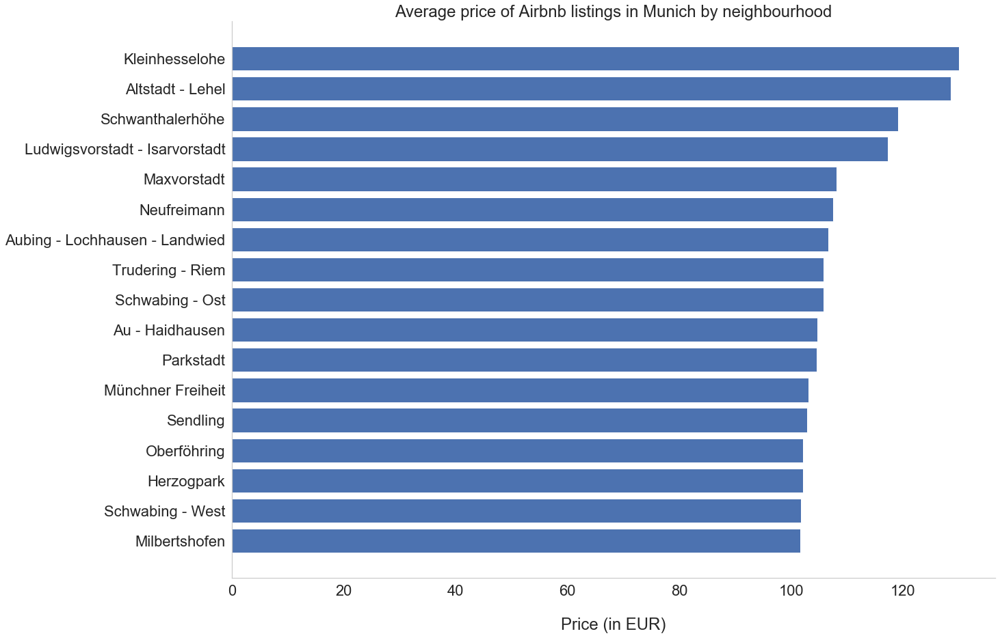

In [56]:
fig, ax = plt.subplots(figsize=(20,15))

yaxis = np.arange(0, len(prices_area_above_avg.index))
rects = ax.barh(yaxis, prices_area_above_avg)
ax.grid(False)

sns.set(font_scale=2, style='whitegrid')
sns.despine()
ax.set_title("Average price of Airbnb listings in Munich by neighbourhood")
ax.set(xlabel='Price (in EUR)')
ax.xaxis.labelpad = 28
ax.yaxis.labelpad = 24
ax.set_yticklabels(prices_area_above_avg.index)
ax.set_yticks(yaxis)

#### Calculate the overall minimum, average, and maximum price of Airbnb listings in Munich in 2019

In [57]:
df_calendar.price.describe()

count    4.179489e+06
mean     1.014470e+02
std      6.710209e+01
min      9.000000e+00
25%      5.500000e+01
50%      8.200000e+01
75%      1.210000e+02
max      4.000000e+02
Name: price, dtype: float64

In [58]:
# Finding the 95th percentile of the prices of all listings.
price_all_array = np.array(df_calendar.price)
top_percentile = np.percentile(price_all_array, 95)

# Finding the 5th percentile of the prices of all listings.
bottom_percentile = np.percentile(price_all_array, 9)

In [59]:
# Filtering for the bottom percentile listings in general ...
df_low_priced_listings = df_calendar[df_calendar.price <= bottom_percentile]

# ... and during the Oktoberfest season.
df_low_priced_listings_oktoberfest = df_low_priced_listings[(df_low_priced_listings.date > '2019-09-10') & (df_low_priced_listings.date < '2019-10-10')]

#### Searching for the geographic data of the low priced listings and their average price during the Oktoberfest.

In [60]:
low_priced_coordinates = df_listings_detailed[df_listings_detailed['id'].isin(df_low_priced_listings_oktoberfest['listing_id'])].groupby('id').mean()
low_priced_avg_price = round(df_listings_detailed[df_listings_detailed['id'].isin(df_low_priced_listings_oktoberfest['listing_id'])].groupby('id').mean()['price'].mean(), 2)
print("Below the 9th percentile during the Oktoberfest, there were", len(low_priced_coordinates), "listings with an average price of", low_priced_avg_price, "EUR.")

Below the 9th percentile during the Oktoberfest, there were 1006 listings with an average price of 34.48 EUR.


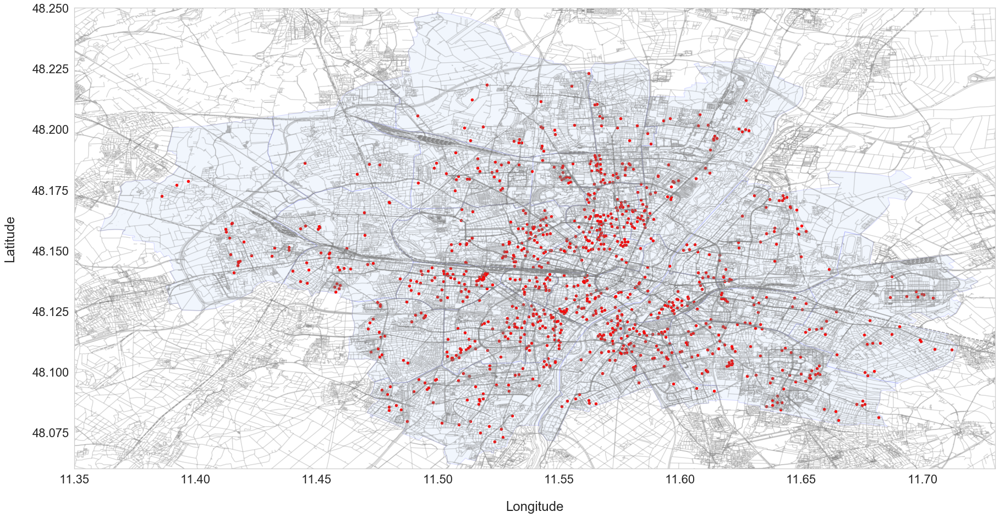

In [61]:
df_low_priced_listings_geodata = gpd.GeoDataFrame(low_priced_coordinates, geometry=[Point(coordinates) for coordinates in zip(low_priced_coordinates['longitude'], low_priced_coordinates['latitude'])])
df_low_priced_listings_geodata.crs = {'init' :'epsg:4326'}
visualize_geo_data(df_low_priced_listings_geodata, color='red')

#### Searching for the geographic data of the high priced listings and their average price during the Oktoberfest.

In [62]:
df_high_priced_listings = df_calendar[df_calendar.price >= top_percentile]
df_high_priced_listings_oktoberfest = df_high_priced_listings[(df_high_priced_listings.date > '2019-09-10') & (df_high_priced_listings.date < '2019-10-10')]

high_priced_coordinates = df_listings_detailed[df_listings_detailed['id'].isin(df_high_priced_listings_oktoberfest['listing_id'])].groupby('id').mean()
high_priced_avg_price = round(df_listings_detailed[df_listings_detailed['id'].isin(df_high_priced_listings_oktoberfest['listing_id'])].groupby('id').mean()['price'].mean(), 2)
print("Above the 95th percentile during the Oktoberfest, there were", len(high_priced_coordinates), "listings with an average price of", high_priced_avg_price, "EUR.")

Above the 95th percentile during the Oktoberfest, there were 979 listings with an average price of 211.1 EUR.


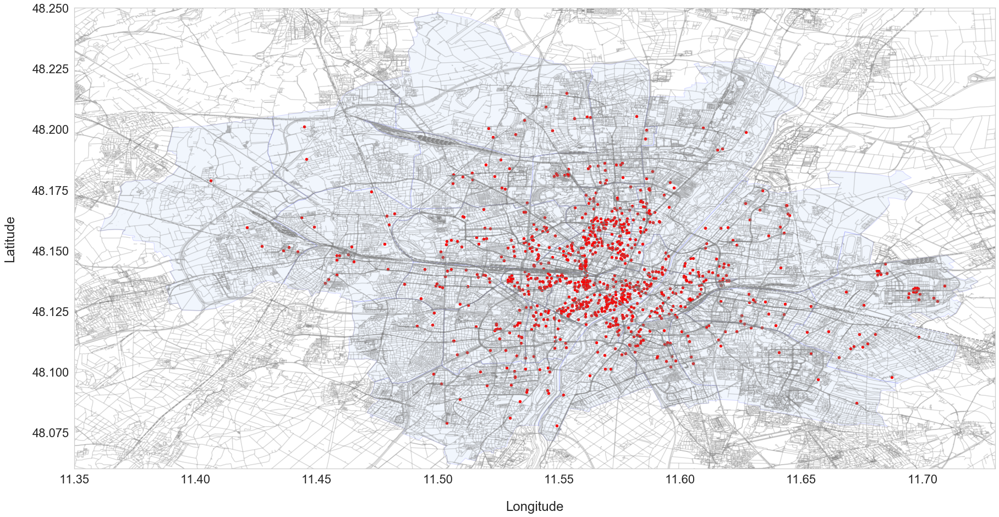

In [63]:
df_high_priced_listings_geodata = gpd.GeoDataFrame(high_priced_coordinates, geometry=[Point(coordinates) for coordinates in zip(high_priced_coordinates['longitude'], high_priced_coordinates['latitude'])])
df_high_priced_listings_geodata.crs = {'init' :'epsg:4326'}
visualize_geo_data(df_high_priced_listings_geodata, color='red')

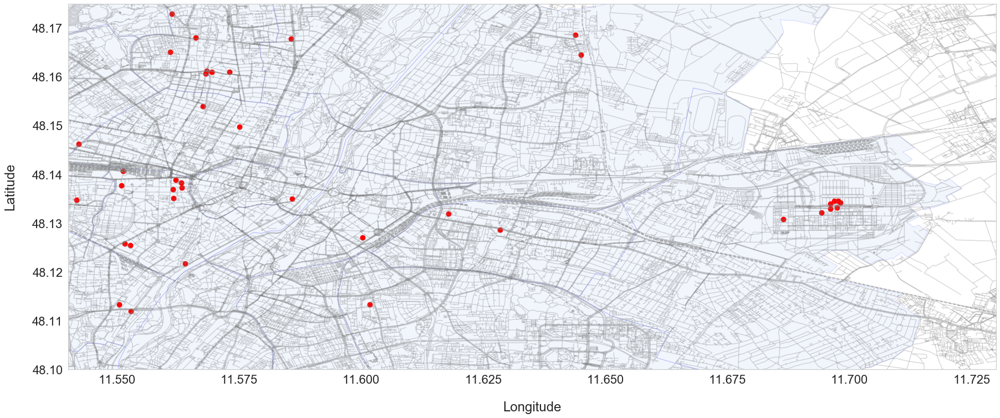

In [66]:
# Visualizing the location of listings with comparatively strong price deviation ("top deviators") during the Oktoberfest.
strong_deviators_oktoberfest = strong_deviators[(strong_deviators.date > '2019-09-10') & (strong_deviators.date < '2019-10-10')]
strong_deviators_oktoberfest_coordinates = df_listings_detailed[df_listings_detailed['id'].isin(strong_deviators_oktoberfest['listing_id'])].groupby('id').mean()
df_strong_deviators_oktoberfest_coordinates_geodata = gpd.GeoDataFrame(strong_deviators_oktoberfest_coordinates, geometry=[Point(coordinates) for coordinates in zip(strong_deviators_oktoberfest_coordinates['longitude'], strong_deviators_oktoberfest_coordinates['latitude'])])
df_strong_deviators_oktoberfest_coordinates_geodata.crs = {'init' :'epsg:4326'}
visualize_geo_data(df_strong_deviators_oktoberfest_coordinates_geodata, color='red', zoom=[11.54, 11.73, 48.10, 48.175], markersize=80)

In [67]:
# Searching for an example of strong price deviation during the Oktoberfest period (price jumped from 39 EUR to 900 EUR around the time of the festival from 21 September to 6 October 2019).
listings_deviating_prices_strongly_coordinates.sort_values('latitude')
df_calendar[df_calendar.listing_id == 19818412].iloc[280:320,:]

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
1650049,19818412,2019-09-01,t,39.000000,39.0,1,1125
1650050,19818412,2019-09-02,t,39.000000,39.0,1,1125
1650051,19818412,2019-09-03,t,39.000000,39.0,1,1125
1650052,19818412,2019-09-04,t,39.000000,39.0,1,1125
1650053,19818412,2019-09-05,t,39.000000,39.0,1,1125
1650054,19818412,2019-09-06,t,39.000000,39.0,1,1125
1650055,19818412,2019-09-07,t,39.000000,39.0,1,1125
1650056,19818412,2019-09-08,t,39.000000,39.0,1,1125
1650057,19818412,2019-09-09,t,39.000000,39.0,1,1125
1650058,19818412,2019-09-10,t,39.000000,39.0,1,1125


# When were the most listings available?

#### Results:
- There were always more listings not available than available
- The first quarter of the year had the most listings available. During the rest of the year, the availability of listings decreased.

#### Finding the amount of not-available listings per day

In [68]:
def encoding_str_to_int(dataframe, column, datetime_column, string_data, integer):
    """Method to replace string data in a dataframe with an integer.
    
    Specific method for encoding string data in a dataframe with time series data to an integer.
    Filters for specific string data in a column and then replaces this string data with an integer.
    Sums up the encoded column and groups by a datetime column.
    Returns this column as a DataFrame.
    
    :param dataframe: pandas.core.frame.DataFrame
    :param column: str
    :param datetime_column: str
    :param string_data: str
    :param integer: int
    
    >>> df_availability = encoding_str_to_int(df_calendar, 'available', 'date', 'f', 1)
    """
    
    df_filtered = dataframe[dataframe[column] == string_data]
    df_filtered[column] = df_filtered[column].replace(string_data, integer)
    df_encoded = df_filtered.groupby(datetime_column).sum()
    return df_encoded

In [69]:
listings_unavailability = encoding_str_to_int(df_calendar, 'available', 'date', 'f', 1)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


#### Finding the amount of available listings per day

In [70]:
listings_availability = encoding_str_to_int(df_calendar, 'available', 'date', 't', 1)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


#### Visualizing the count of unavailable & available listings of the year

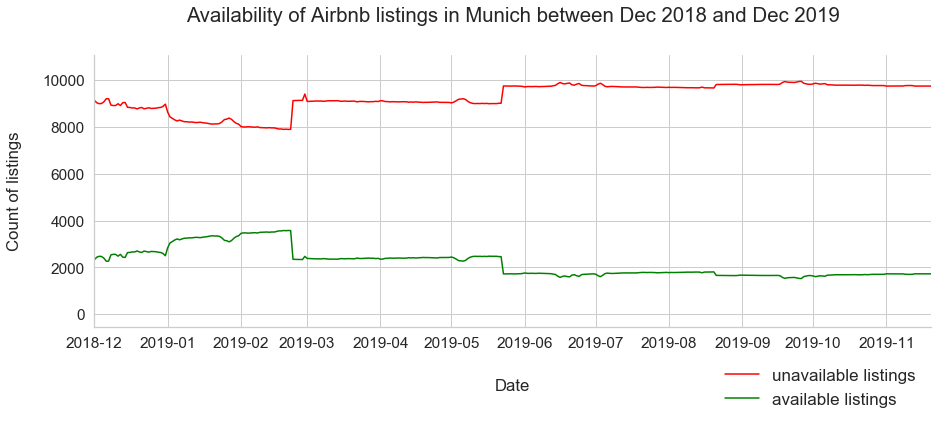

In [84]:
# There was a sudden increase of unavailable listings in March 2019. A quick research on Google did not yield useful results.
f, ax = plt.subplots(figsize=(15,5))

plt1 = sns.lineplot(ax=ax, x=listings_unavailability.index, y=listings_unavailability.available, color="red")
plt2 = sns.lineplot(ax=ax, x=listings_availability.index, y=listings_availability.available, color="green")

sns.set(font_scale=1.7, style='whitegrid')
sns.despine()
ax.set_title('Availability of Airbnb listings in Munich between Dec 2018 and Dec 2019', y=1.10)
ax.set(xlabel='Date', ylabel='Count of listings', xlim=['2018-12-01', '2019-11-20'])
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
ax.xaxis.labelpad = 28
ax.yaxis.labelpad = 20
plt.legend(['unavailable listings', 'available listings'], loc="center right", bbox_to_anchor=(1, -0.225), fontsize='small', frameon=False)

# Are there any aspects of a listing which allow to conclude whether a listing is available?

#### Results:
- As the next steps will show, I could not find any characteristic of a listing that would not randomly help to categorize a listing with regard to its availability.

In [85]:
# Finding the availability of each listing for each day.
availability_status = df_calendar.groupby(['listing_id', 'date']).last()

In [86]:
# Filtering for unavailable listings.
false_ava = availability_status[availability_status.available=='f'].sort_index()
false_ava.drop(false_ava.iloc[:,1:], axis=1, inplace=True)

In [87]:
# Creating a dataframe with a count on all listings which had an unavailable status in 2019.
unavailability = []

for listing, counter in false_ava.groupby(level=0):
    res = len(counter.values)
    unavailability.append(res)

listing_ids = list(false_ava.index.get_level_values(0).unique())
index = range(0, len(listing_ids))
data = {'listing_ids' : listing_ids, 'unavailability' : unavailability}

df_unavailability = pd.DataFrame(index=index, data=data)

In [88]:
# Filtering for available listings.
true_ava = availability_status[availability_status.available == "t"].sort_index()
true_ava.drop(false_ava.iloc[:,1:], axis=1, inplace=True)

In [89]:
# Creating a dataframe with a count on all listings which had an available status in 2019.
availability = []

for listing, counter in true_ava.groupby(level=0):
    res = len(counter.values)
    availability.append(res)
    
listing_ids_ta = list(true_ava.index.get_level_values(0).unique())
index_2 = range(0, 5711)
data_2 = {'listing_ids' : listing_ids_ta, 'availability' : availability}

df_availability = pd.DataFrame(index=index_2, data=data_2)

In [90]:
# Merging the last two dataframes.
df = pd.merge(df_unavailability, df_availability, how='outer', on='listing_ids')
df = df.fillna(0.0)

In [91]:
# Filtering for listings which were sometimes available.
# Those listings were not available or unavailable over the entire year.
# I create categories to differentiate between them.
df_notnull = df[df.unavailability != 0]
df_notnull = df_notnull[df_notnull.availability != 0]

In [92]:
# I define these categories by calculating a ratio, i.e. whether a listing has been less or more available.
df_notnull['sum'] = df_notnull['unavailability'] + df_notnull['availability']
df_notnull['ratio'] = df_notnull['availability'] / df_notnull['sum']

In [93]:
# Encoding the categories in between with specific floats.
df_notnull.loc[df_notnull.ratio <= 0.33, 'ratio'] = 0.1
df_notnull.loc[df_notnull.ratio > 0.66, 'ratio'] = 0.2
df_notnull.loc[((df_notnull.ratio > 0.33) & (df_notnull.ratio <= 0.66)), 'ratio'] = 0.3

In [94]:
# Replacing the specific floats with category labels.
df_notnull.loc[df_notnull.ratio == 0.1, 'ratio'] = "rarely available"
df_notnull.loc[df_notnull.ratio == 0.2, 'ratio'] = "frequently available"
df_notnull.loc[df_notnull.ratio == 0.3, 'ratio'] = "normally available"

In [95]:
# Dropping the temporary "sum" column.
df_notnull = df_notnull.drop('sum', axis=1)

In [96]:
# Categorizing listings which have always been available.
df_alwaysavailable = df[df.unavailability == 0]
df_alwaysavailable['ratio'] = "always available"

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [97]:
# Categorizing listings which have never been available.
df_neveravailable = df[df.availability == 0]
df_neveravailable['ratio'] = "never available"

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [98]:
# Bringing the dataframes which hold information on availability categories together.
df_final = df_notnull.append([df_alwaysavailable, df_neveravailable])

# Step 4: Feature Selection, Modeling, & Evaluation

This section shows how I found an answer to my fourth question.

In [99]:
# At the beginning, I considered all information on listings which
# a) was not related to price
# b) was not missing anyways
# c) had more than one unique value
# d) and which had not been created by a free text field.

temp_features = df_listings_detailed[[
                'id',
                'host_is_superhost',
                'host_has_profile_pic',
                'host_identity_verified',
                'is_location_exact',
                'property_type',
                'room_type',
                'accommodates',
                'bathrooms',
                'bedrooms',
                'beds',
                'guests_included',
                'number_of_reviews',
                'instant_bookable',
                'cancellation_policy',
                'require_guest_phone_verification']]

In [100]:
# Verifying my current choice of features against my own criteria.
print("Count of NaN values: \n")
print(temp_features.isnull().sum(), "\n")
for col in temp_features:
    print(col, ":", temp_features[col].unique(), ",", temp_features[col].nunique(), ",", temp_features[col].value_counts(), "\n")
temp_features = temp_features.dropna(axis=1, how='all')

Count of NaN values: 

id                                   0
host_is_superhost                   23
host_has_profile_pic                23
host_identity_verified              23
is_location_exact                    0
property_type                        0
room_type                            0
accommodates                         0
bathrooms                           21
bedrooms                            30
beds                                18
guests_included                      0
number_of_reviews                    0
instant_bookable                     0
cancellation_policy                  0
require_guest_phone_verification     0
dtype: int64 

id : [   36720    97945   114695 ... 40344151 40347084 40354205] , 11481 , 14174207    1
20878560    1
28865788    1
7707897     1
15766776    1
           ..
23102117    1
28023868    1
38345928    1
32152934    1
35591602    1
Name: id, Length: 11481, dtype: int64 

host_is_superhost : ['f' 't' nan] , 2 , f    10009
t     1449
Name: h

In [101]:
# Further narrowing down my choice of features to primarily categorical data.
temp_features_2 = temp_features[[
                'id',
                'host_is_superhost',
                'host_has_profile_pic',
                'host_identity_verified',
                'is_location_exact',
                'room_type',
                'bedrooms',
                'instant_bookable',
                'cancellation_policy']]

In [102]:
# Categorizing the data on bedrooms.
temp_features_2.loc[temp_features_2.bedrooms > 0, 'bedrooms'] = "minimum a bed"
temp_features_2.loc[temp_features_2.bedrooms == 0, 'bedrooms'] = "no bed"

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [103]:
# Merging the current features set with its target - the new availability category.
temp_features_2.rename(columns={'id' : 'listing_ids'}, inplace=True)
df_data = pd.merge(temp_features_2, df_final, how='outer', on='listing_ids')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4238: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(**kwargs)


In [104]:
# Cleaning up the preliminary data set.
df_data.drop(['unavailability', 'availability'], axis=1, inplace=True)
df_data.rename(columns={'ratio' : 'status_availability'}, inplace=True)

In [105]:
# Dummy-encoding the features and the target.
categorical_columns = [
    'host_is_superhost',
    'host_has_profile_pic',
    'host_identity_verified',
    'is_location_exact',
    'room_type',
    'bedrooms',
    'instant_bookable',
    'cancellation_policy',
    'status_availability']

df_data_encoded = pd.get_dummies(df_data, columns=categorical_columns)

In [106]:
# Splitting up the feature and target data sets into a training set and a test set
X=df_data_encoded[list(df_data_encoded.columns)[1:22]]
y=df_data_encoded[list(df_data_encoded.columns)[22:]]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [107]:
# Fitting the random forest classifier.
random_forest_clf = RandomForestClassifier(n_jobs=-1, random_state=0)
random_forest_clf.fit(X_train,y_train)
y_pred=random_forest_clf.predict(X_test)
print(metrics.accuracy_score(y_test, y_pred))

0.3849056603773585


In [108]:
# Identifying the explanatory power of features.
feature_imp = pd.Series(random_forest_clf.feature_importances_,index=X.columns).sort_values(ascending=False)
feature_imp

host_is_superhost_t                                0.122291
cancellation_policy_strict_14_with_grace_period    0.101063
host_is_superhost_f                                0.084370
cancellation_policy_flexible                       0.062532
room_type_Hotel room                               0.056271
bedrooms_minimum a bed                             0.050515
room_type_Private room                             0.050381
room_type_Entire home/apt                          0.050319
is_location_exact_f                                0.049510
host_identity_verified_t                           0.048542
bedrooms_no bed                                    0.047237
host_identity_verified_f                           0.046767
is_location_exact_t                                0.045593
cancellation_policy_moderate                       0.044285
instant_bookable_t                                 0.041372
instant_bookable_f                                 0.039883
room_type_Shared room                   

In [109]:
# Reducing the number of features & splitting the data again.
X_reduced = X[list(feature_imp.index)[0:16]]

X_train, X_test, y_train, y_test = train_test_split(X_reduced, y, test_size=0.3)

In [110]:
# Using a grid search to search for optimal parameters for the classifier.
parameter_grid = dict(n_estimators=list(range(1, 5001, 1000)),
                      criterion=['gini','entropy'],
                      max_features=list(range(1, round(np.sqrt(len(X_reduced.columns))).astype(int))))
clf = GridSearchCV(estimator=random_forest_clf, param_grid=parameter_grid, cv=5, verbose=1, n_jobs=-1)

In [188]:
accuracy_scores = cross_val_score(clf, X_train, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  7.0min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  7.0min finished


Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  7.0min finished


Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  7.0min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  7.1min finished


In [189]:
print('Accuracy scores:', accuracy_scores)
print('Mean of accuracy scores:', np.mean(accuracy_scores))
print('Variance of accuracy scores:', np.var(accuracy_scores))

Accuracy scores: [0.37624378 0.38394524 0.38394524 0.38145613 0.40821406]
Mean of score: 0.38676089063085317
Variance of scores: 0.00012296889820775456


In [111]:
# Creating a second run for using grid search for optimal parameters.
parameter_grid_2 = dict(n_estimators=list(range(5000, 10001, 1000)),
                      criterion=['gini','entropy'],
                      max_features=list(range(1, round(np.sqrt(len(X_reduced.columns))).astype(int))))
clf_2 = GridSearchCV(estimator=random_forest_clf, param_grid=parameter_grid_2, cv=5, verbose=1, n_jobs=-1)

In [192]:
accuracy_scores_2nd = cross_val_score(clf_2, X_train, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed: 32.7min finished


Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed: 33.0min finished


Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed: 32.9min finished


Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed: 31.8min finished


Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed: 31.8min finished


In [194]:
print('Accuracy scores:', accuracy_scores_2nd)
print('Mean of accuracy scores:', np.mean(accuracy_scores_2nd))
print('Variance of accuracy scores:', np.var(accuracy_scores_2nd))

Accuracy scores: [0.38308458 0.38270068 0.38830118 0.40136901 0.41132545]
Mean of score: 0.39335618113539333
Variance of scores: 0.00012633971422731566


In [112]:
# Reducing the number of features & splitting the data again.
X_reduced_2 = X[list(feature_imp.index)[0:4]]

X_train, X_test, y_train, y_test = train_test_split(X_reduced_2, y, test_size=0.3)

In [113]:
# Performing a third run for using grid search for optimal parameters.
parameter_grid_3 = dict(n_estimators=list(range(10000, 20001, 2000)),
                      criterion=['gini','entropy'],
                      max_features=list(range(1, round(np.sqrt(len(X_reduced_2.columns))).astype(int))))
clf_3 = GridSearchCV(estimator=random_forest_clf, param_grid=parameter_grid_3, cv=5, verbose=1, n_jobs=-1)

In [84]:
accuracy_scores_3rd = cross_val_score(clf_3, X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed: 16.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed: 25.4min finished


Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed: 16.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed: 25.3min finished


Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed: 16.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed: 25.6min finished


Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed: 16.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed: 25.1min finished


Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed: 25.6min finished


In [85]:
print('Accuracy scores:', accuracy_scores_3rd)
print('Mean of accuracy scores:', np.mean(accuracy_scores_3rd))
print('Variance of accuracy scores:', np.var(accuracy_scores_3rd))

Accuracy scores: [0.3619403  0.34598631 0.37585563 0.36527691 0.37647791]
Mean of score: 0.3651074125328553
Variance of scores: 0.00012409766291527298


In [114]:
# A final run with previous parameter settings.
parameter_grid_4 = dict(n_estimators=list(range(5000, 9001, 1000)),
                      criterion=['gini','entropy'],
                      max_features=list(range(1, round(np.sqrt(len(X_reduced_2.columns))).astype(int))))
clf_4 = GridSearchCV(estimator=random_forest_clf, param_grid=parameter_grid_4, cv=5, verbose=1, n_jobs=-1)

In [143]:
accuracy_scores_4th = cross_val_score(clf_4, X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed: 10.1min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  9.9min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed: 10.1min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed: 10.7min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed: 10.7min finished


In [144]:
print('Accuracy scores:', accuracy_scores_4th)
print('Mean of accuracy scores:', np.mean(accuracy_scores_4th))
print('Variance of accuracy scores:', np.var(accuracy_scores_4th))

Accuracy scores: [0.36567164 0.35594275 0.37523335 0.39390168 0.34598631]
Mean of score: 0.36734714727544604
Variance of scores: 0.00027129768653555506


#### At this point, I concluded that there seemed to be no explanatory effect of the characteristics of a listing on its availability status.

# Summary

In this analysis, I applied descriptive statistics & supervised machine learning. I used data on Airbnb data for Munich (from 2019) & geographic data. Thereby I provided answers to the following questions:

**When was the most expensive time to book an Airbnb listing in Munich in 2019?**

Prices for listings were the highest during Oktoberfest.
 

**Where were the most expensive listings located?**

Central areas were the most expensive.
 

**When were the most listings available?**

The number of available listings was the highest in the first quarter of the year.
 

**Are there any aspects of a listing which allow to conclude whether a listing is available?**

Conclusions on the availability of a listing based on certain aspects of a listing are random.
